In [1]:
from pathlib import Path
root_path = Path("/home/ubuntu/sr")

In [2]:
assert(root_path.exists())

In [3]:
%load_ext autoreload
%autoreload 2
from srgan.train import *

In [9]:
from srgan.checkpoint import *
from srgan.models import *

In [10]:
# load_checkpoint?

In [11]:
device = torch.device("cpu")
print(device)    

cpu


In [39]:
upscale_factor = 4
image_channels = 3
residual_block_channels = 64
num_residual_blocks = 16
num_middle_blocks = 7

generator = Generator(upscale_factor=upscale_factor,
                        image_channels=image_channels,
                        residual_block_channels=residual_block_channels,
                        num_residual_blocks=num_residual_blocks).to(device)

discriminator = Discriminator(
        image_channels=image_channels,
        num_middle_blocks=num_middle_blocks).to(device)


In [40]:
generator, discriminator = load_checkpoint(generator, discriminator, "/home/ubuntu/sr/model_checkpoint/aishu/srgan_v0.pth", device)

In [41]:
valid_dataset = SRImageDataset("/home/ubuntu/sr/training_data/", is_valid=True)

In [42]:
example, hr = valid_dataset[38]
generator.eval()
out = generator(example.unsqueeze(0).to(device)).to("cpu").squeeze(0)
# F.mse_loss(out, hr)

In [43]:
from torchvision.transforms import ToTensor, ToPILImage

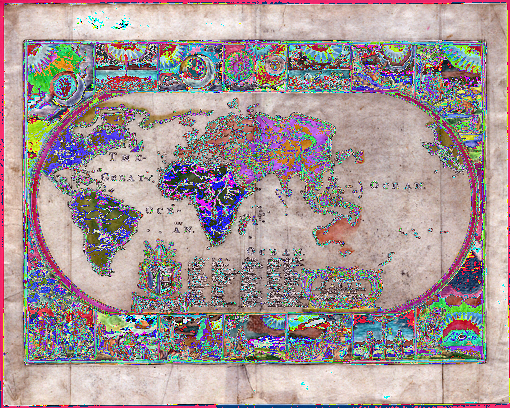

In [44]:
ToPILImage()(example)

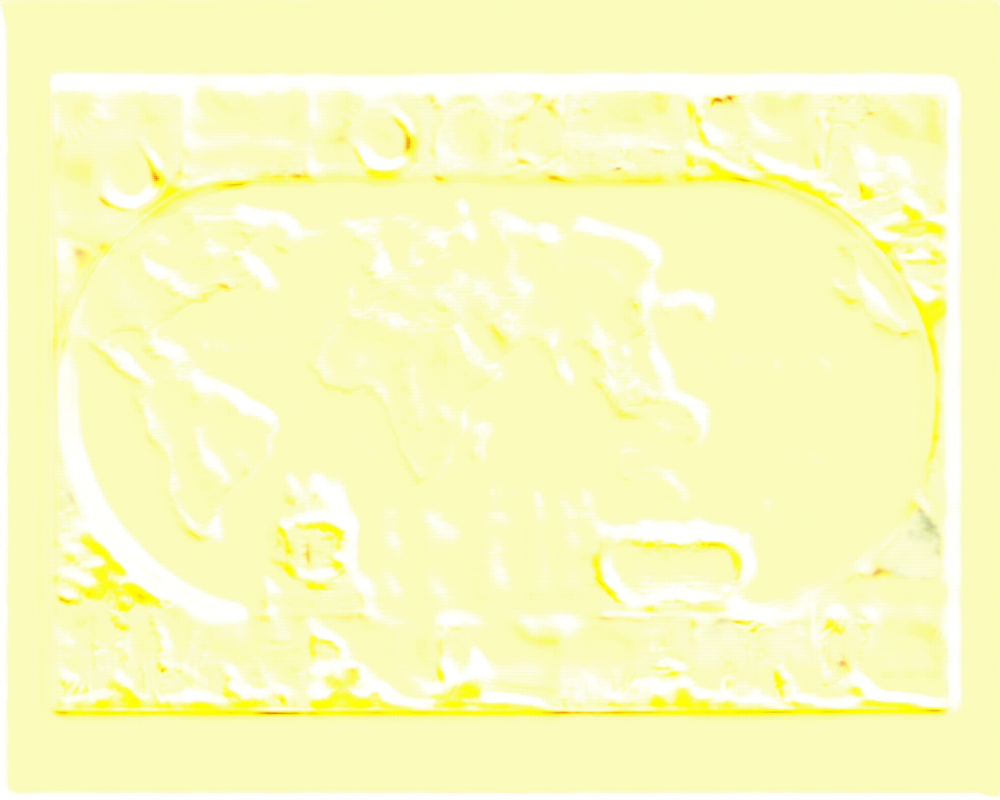

In [45]:
output_to_pil_image(out)

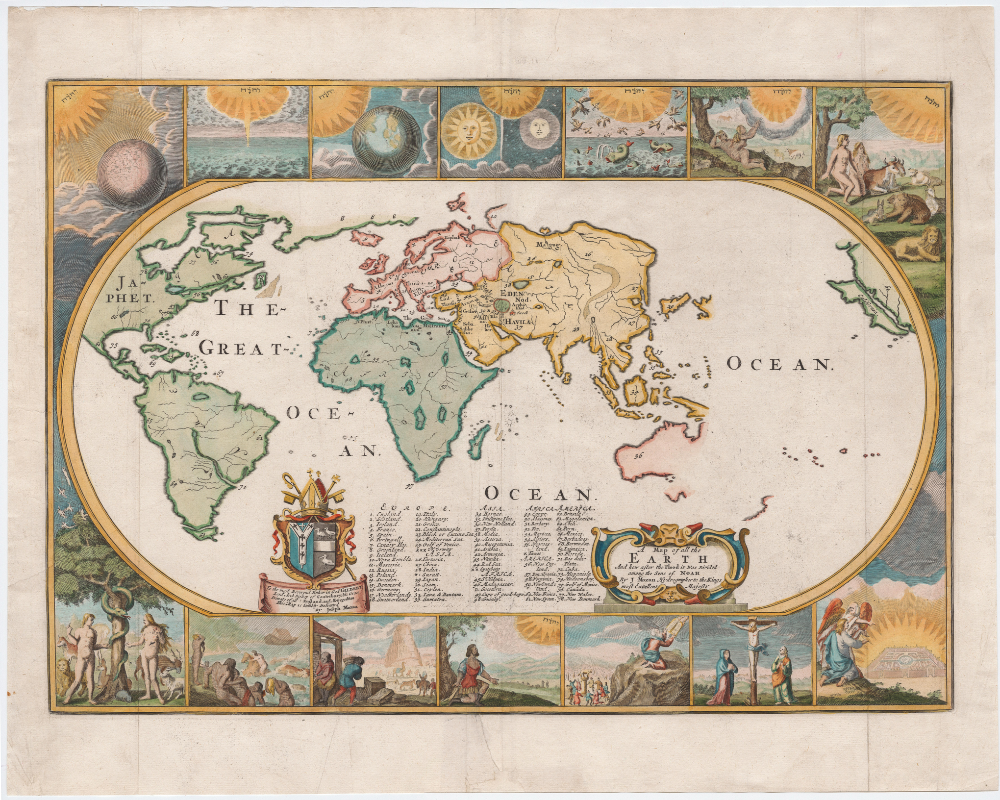

In [46]:
ToPILImage()(hr)

In [47]:
example.shape, hr.shape, out.shape

(torch.Size([3, 408, 510]),
 torch.Size([3, 1632, 2040]),
 torch.Size([3, 1632, 2040]))

In [37]:
del example, hr, out

In [38]:
del valid_dataset, generator